In [1]:
#import models
import numpy as np
import sys, os
import rospy
import rosbag
import math
from scipy.interpolate import interp1d
import matplotlib.pylab as plt
import time 
from tqdm.auto import tqdm


In [2]:
import random

import numpy as np
import torch


def seed_everything(seed: int):
    r"""Sets the seed for generating random numbers in PyTorch, numpy and
    Python.

    Args:
        seed (int): The desired seed.
    """
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    
seed_everything(0)

In [3]:
#parameters of processing
#start afcontact_status85038031343
frequency = 30 #Hz
bag_file_name = '/home/hussain/catkin_ws/small_example5_heavy_one_phi_4thetas.bag'#'/home/hussain/me/projehpmcts/tactile/data/dataset_ENVTACT_new2.bag'
time_window_size = 6
examples_per_edge = 1

bag_file = rosbag.Bag(bag_file_name)

In [4]:
events = []
contact_status = []
contact_status_ts = []
contact_case = [] #0:No contact 1: center, 2:remainder of contacts as in list_of_rotations
contact_case_ts = []
contact_angle = []

contact_case_updated = []
contact_case_updated_ts = []

event_packet_size = []
event_packet_size_ts = []
contact_angle = []

#[math.radians(i) for i in range(1,11)]#

#generate label
possible_angle = [math.radians(9)]#[math.radians(3), math.radians(6), math.radians(9), math.radians(12)]
N_examples = 5
list_of_rotations = [[0, 0, 0]]

for i in range(1, N_examples):
    theta = [np.nan, 0, math.pi/6, math.pi/3, math.pi/2][i]#math.pi/2 #i * 2 * math.pi/(N_examples - 1)
    for phi in possible_angle:
        rx = phi * math.cos(theta)
        ry = phi * math.sin(theta)
        rotvec = [rx, ry, 0]
        list_of_rotations.append(rotvec)

print(len(list_of_rotations))
print(list_of_rotations)

cases_dict = {i+1: list_of_rotations[i][:2] for i in range(len(list_of_rotations))}
cases_dict[0] = [0, 0]
cases_dict

5
[[0, 0, 0], [0.15707963267948966, 0.0, 0], [0.13603495231756635, 0.07853981633974481, 0], [0.07853981633974484, 0.13603495231756632, 0], [9.618353468608949e-18, 0.15707963267948966, 0]]


{1: [0, 0],
 2: [0.15707963267948966, 0.0],
 3: [0.13603495231756635, 0.07853981633974481],
 4: [0.07853981633974484, 0.13603495231756632],
 5: [9.618353468608949e-18, 0.15707963267948966],
 0: [0, 0]}

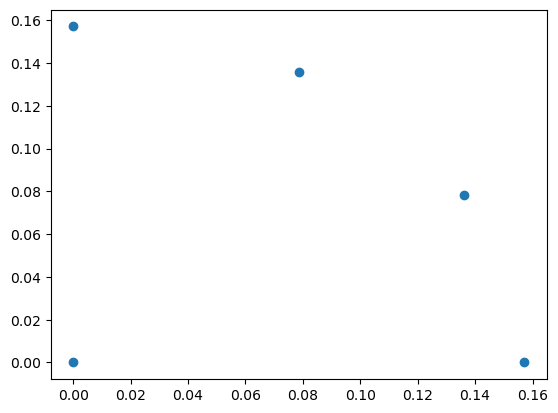

In [5]:
plt.scatter(*np.round(np.array(list_of_rotations)[:, :2].T, decimals=4))

In [7]:
from rospy import Time
start_time = 1672235485038031343*1e-9
#parse from 1672235485038031343 onwards
events = []
contact_status = []
contact_status_ts = []
contact_angle = []
contact_angle = []

topics = ['/contact_status', '/contact_angle']

for topic, msg, t in tqdm(
    bag_file.read_messages(topics=topics),#, start_time=Time(start_time)), 
    total=sum([bag_file.get_message_count(top) for top in topics]),
    desc='parsing bag',
    unit='msg'
):
    if topic == '/dvs/events':
        for e in msg.events:
            event = [e.x, e.y, e.ts.to_nsec(), e.polarity]
            events.append(event)
    elif topic == '/contact_status':
        contact_status.append(msg.data)
        contact_status_ts.append(t.to_nsec())
    elif topic == '/contact_angle':
        contact_angle.append([msg.x, msg.y, msg.z])

        # Updated contact status according to no. of events

#print(events)
bag_file.close()

contact_angle = np.array(contact_angle)

import pandas as pd

df = pd.DataFrame({ 
    'ts': contact_status_ts,
    'contact_status': contact_status, 
    'contact_angle_x': contact_angle[:, 0],
    'contact_angle_y': contact_angle[:, 1],
    'contact_angle_z': contact_angle[:, 2],
    }
)

parsing bag:   0%|          | 0/55320 [00:00<?, ?msg/s]

import pandas as pd

df = pd.read_csv('parsed_bag2.csv')

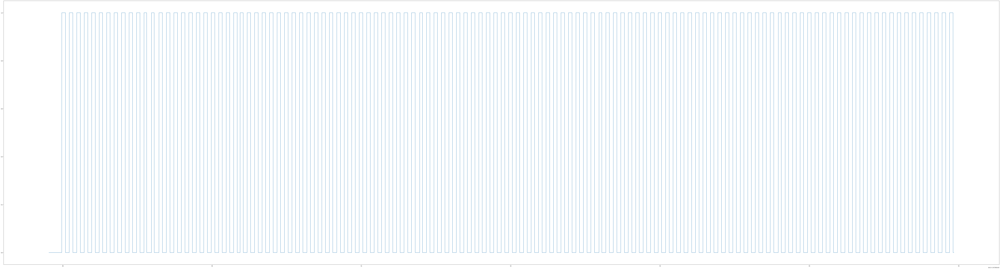

In [8]:
import matplotlib.pyplot as plt
plt.figure(figsize=(150, 40))
plt.plot(df['ts'], df['contact_status'])

In [9]:
def find_case(idx):
    if not df['contact_status'][idx]:
        return 0
    else:
        best_rot_diff = 100
        best_rot_idx = 1
        i = 1
        x, y, z = df[['contact_angle_x', 'contact_angle_y', 'contact_angle_z']].iloc[idx]
        for rot in list_of_rotations:
            diff_vals = np.sqrt(np.power(rot[0] - x, 2) +  np.power(rot[1] - y, 2) + np.power(rot[2] - z, 2))
            if best_rot_diff > diff_vals:
                best_rot_diff = diff_vals
                best_rot_idx = i
            i = i + 1
        return best_rot_idx


In [10]:
contact_case = [find_case(idx) for idx in range(len(df))]
df['contact_case'] = contact_case

In [11]:
df

,ts,contact_status,contact_angle_x,contact_angle_y,contact_angle_z,contact_case
0,1672824890667492387,False,-0.017921,0.148827,0.005649,0
1,1672824890683876947,False,-0.017926,0.148871,0.005566,0
2,1672824890711977065,False,-0.018005,0.148813,0.005596,0
3,1672824890743620332,False,-0.017916,0.148840,0.005590,0
4,1672824890775067064,False,-0.017982,0.148835,0.005573,0
...,...,...,...,...,...,...
27655,1672825496717970989,False,0.001955,0.158068,0.002260,0
27656,1672825496718132542,False,0.001947,0.158037,0.002310,0
27657,1672825496745962531,False,0.001925,0.158028,0.002186,0
27658,1672825496757841455,False,0.001925,0.158013,0.002274,0


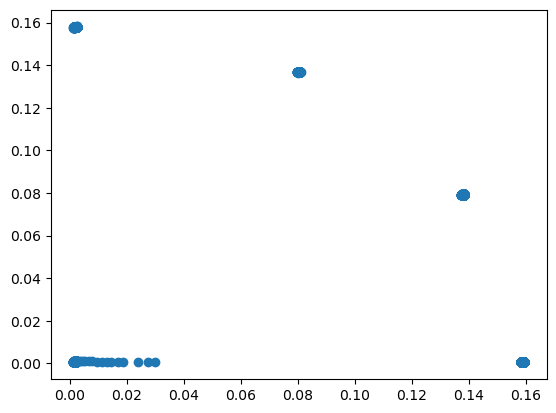

In [12]:
plt.scatter(df['contact_angle_x'][df['contact_status']], df['contact_angle_y'][df['contact_status']])

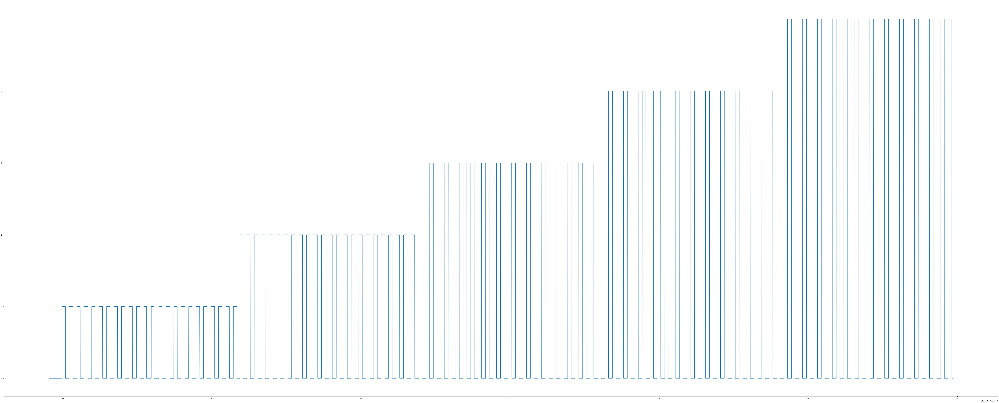

In [13]:

plt.figure(figsize=(100, 40))
plt.plot(df['ts'], df['contact_case'])


In [14]:
from rospy import Time
import dask.array as da
#parse from 1672235485038031343 onwards
events = []
bag_file = rosbag.Bag(bag_file_name)
topics = ['/dvs/events']

for topic, msg, t in tqdm(
    bag_file.read_messages(topics=topics), 
    total=sum([bag_file.get_message_count(top) for top in topics]),
    desc='parsing bag',
    unit='msg'
):
    if topic == '/dvs/events':
        ev_array = []
        for e in msg.events:
            event = [e.x, e.y, e.ts.to_nsec(), e.polarity]
            ev_array.append(event)
        events.append(da.array(ev_array))

        # Updated contact status according to no. of events

        
da_event = da.vstack(events)
da_event.to_hdf5('small5.hdf5', 'events')

parsing bag:   0%|          | 0/18529 [00:00<?, ?msg/s]

In [15]:
import h5py
import dask.array as da

h5_arr = h5py.File('small5.hdf5', 'r')
events = da.array(h5_arr['events'])
events

dask.array<array, shape=(14212870, 4), dtype=int64, chunksize=(4194288, 4), chunktype=numpy.ndarray>

In [16]:
case_span = 2.66e9
find_ts_idx = lambda ts: np.searchsorted(df['ts'], ts)

def look_ahead_big(ts, idx_ts):
    fin_ts = ts + case_span
    fin_idx = find_ts_idx(fin_ts)
    print(fin_idx)
    if df['contact_status'][fin_idx]:
        #look further
        more = True
        fin_idx_ = fin_idx 
        while more:
            fin_idx_ += 1
            if fin_idx_ - fin_idx > 25:
                print('warning more than 25 idx away from init_ts + case_span')
            if df['contact_status'][fin_idx_]:
                continue
            else:
                more = False
        print(f'was before case ended by {fin_idx_ - fin_idx} indexes')
        fin_idx = fin_idx_ - 1
    else:
        #look backwards
        more = True
        fin_idx_ = fin_idx 
        while more:
            fin_idx_ -= 1
            if not df['contact_status'][fin_idx_]:
                continue
            else:
                more = False
        print(f'was ahead case ended by {fin_idx - fin_idx} indexes')
        fin_idx = fin_idx_ + 1
        
    return df['ts'][fin_idx]


def find_case(ts):
    idx = find_ts_idx(ts)
    best_rot_diff = 100
    best_rot_idx = 1
    i = 1
    x, y, z = df[['contact_angle_x', 'contact_angle_y', 'contact_angle_z']].iloc[idx]
    for rot in list_of_rotations:
        diff_vals = np.sqrt(np.power(rot[0] - x, 2) +  np.power(rot[1] - y, 2) + np.power(rot[2] - z, 2))
        if best_rot_diff > diff_vals:
            best_rot_diff = diff_vals
            best_rot_idx = i
        i = i + 1
    return best_rot_idx


i = 0 
cases_ts = []
cases_idx = []
cases = []
pbar = tqdm(total=len(df['contact_status']), desc='extracting contact timestamps')

while i < len(df['contact_status']):
    if df['contact_status'][i]:

        init_ts = df['ts'][i]
        fin_ts = look_ahead_big(init_ts, i)
        fin_idx = find_ts_idx(fin_ts)
        case = find_case(np.mean([init_ts, fin_ts]))
        if case == 1:
            i = fin_idx + 1
            pbar.update(fin_idx + 1 - i)
            continue
            
        cases.append(case)
        cases_ts.append([init_ts, fin_ts])
        cases_idx.append([i, fin_idx])
        print(len(cases_ts), init_ts, fin_ts, (fin_ts - init_ts)*1e-9, i, fin_idx, case, '\n')
        i = fin_idx + 1
        pbar.update(fin_idx + 1 - i)

    else:
        i += 1
        pbar.update(1)

extracting contact timestamps:   0%|          | 0/27660 [00:00<?, ?it/s]

515
was ahead case ended by 0 indexes
738
was ahead case ended by 0 indexes
965
was ahead case ended by 0 indexes
1185
was ahead case ended by 0 indexes
1410
was ahead case ended by 0 indexes
1639
was ahead case ended by 0 indexes
1859
was ahead case ended by 0 indexes
2080
was ahead case ended by 0 indexes
2307
was ahead case ended by 0 indexes
2528
was ahead case ended by 0 indexes
2756
was ahead case ended by 0 indexes
3168
was ahead case ended by 0 indexes
3575
was ahead case ended by 0 indexes
3804
was ahead case ended by 0 indexes
4034
was ahead case ended by 0 indexes
4262
was ahead case ended by 0 indexes
4487
was ahead case ended by 0 indexes
4713
was ahead case ended by 0 indexes
4944
was ahead case ended by 0 indexes
5165
was ahead case ended by 0 indexes
5397
was ahead case ended by 0 indexes
5629
was ahead case ended by 0 indexes
5849
was ahead case ended by 0 indexes
6070
was ahead case ended by 0 indexes
6263
was ahead case ended by 0 indexes
1 1672825018760580834 167282

(array([ 2.,  0.,  1.,  1.,  0.,  0., 15., 26., 36., 15.]),
 array([1.85820817e+09, 1.92304146e+09, 1.98787476e+09, 2.05270805e+09,
        2.11754135e+09, 2.18237464e+09, 2.24720794e+09, 2.31204124e+09,
        2.37687453e+09, 2.44170783e+09, 2.50654112e+09]),
 <BarContainer object of 10 artists>)

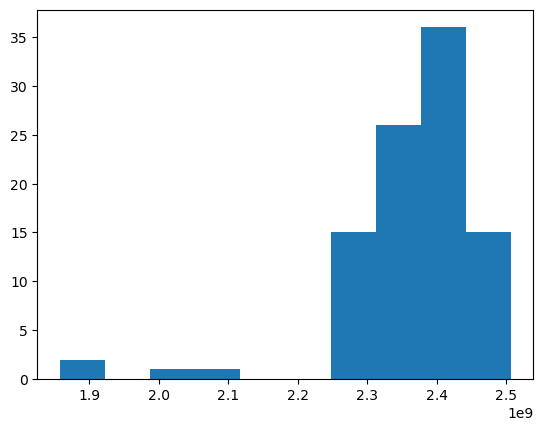

In [17]:
plt.hist([i[1]-i[0] for i in cases_ts])

In [18]:
def ev_ts2idx(ts, guess_idx, init_stepsize=50000):
    stepsize = init_stepsize
    search_sorted = lambda st: da.searchsorted(events[guess_idx:guess_idx+st, 2], da.array([ts])).compute()[0]
    n_iters = 0
    
    out = search_sorted(stepsize)
    
    while out == stepsize:
        n_iters += 1
        stepsize = 10*stepsize
        
        out = search_sorted(stepsize)
    if n_iters > 1:
        print(ts, n_iters)
    return out + guess_idx

In [19]:
delta_t = 0.075e9
margin = -0.025e9#-0.025e9
dist_from_center = lambda x, y: np.sqrt((x - 180)**2 + (y - 117)**2)
circle_rad=85

event_arrays = []
ev_idx_init = []
label_contact_case = []

guess_idx = 0

for i, idx in enumerate(tqdm(cases_idx)):
    init_ts_idx = ev_ts2idx(cases_ts[i][0] + margin, guess_idx)
    ev_idx_init.append(init_ts_idx)
    guess_idx = init_ts_idx
    fin_ts_idx = ev_ts2idx(cases_ts[i][0] + delta_t, guess_idx)#da.searchsorted(events[:, 2], da.array([cases_ts[i][0] + delta_t]))
    guess_idx = fin_ts_idx
    if fin_ts_idx - init_ts_idx + 1 < 0:
        continue    
    else:
        event_array = events[init_ts_idx:fin_ts_idx+1][:5000].compute()

    in_circle = dist_from_center(event_array[:, 0], event_array[:, 1]) < circle_rad  
    event_arrays.append(event_array[in_circle, :])
    label_contact_case.append(cases[i])

  0%|          | 0/96 [00:00<?, ?it/s]

1.672825018735581e+18 2


(array([ 1.,  2.,  3.,  2.,  5.,  6., 25., 21., 28.,  3.]),
 array([4772. , 4788.1, 4804.2, 4820.3, 4836.4, 4852.5, 4868.6, 4884.7,
        4900.8, 4916.9, 4933. ]),
 <BarContainer object of 10 artists>)

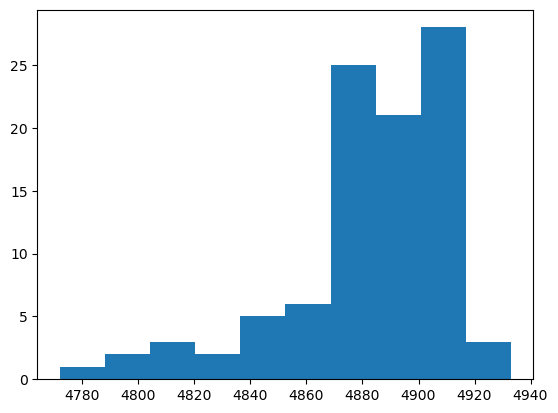

In [20]:
plt.hist([len(ev_arr) for ev_arr in event_arrays])

In [22]:
len(event_arrays)

96

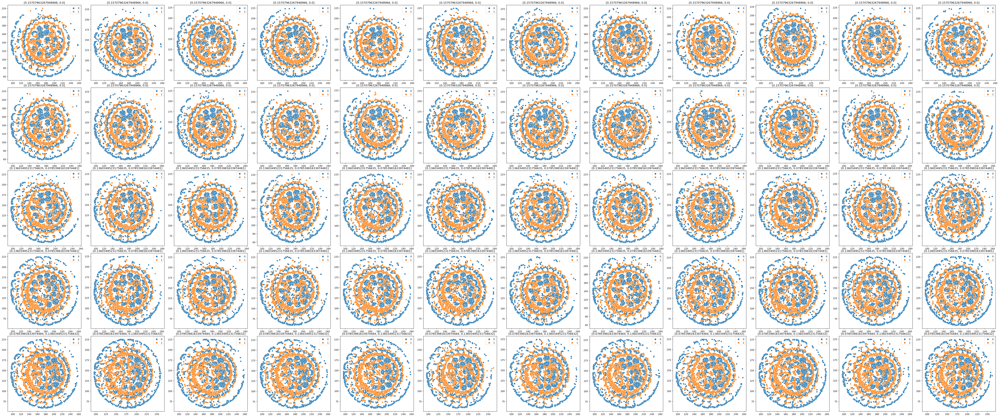

In [21]:
import seaborn as sns
fig, axes = plt.subplots(5, 12, figsize=(12*5, 5*5))
plt.tight_layout()
for i, (ev_arr, ax) in enumerate(zip(event_arrays, axes.ravel())):
    plt.sca(ax)
    sns.scatterplot(x=ev_arr[:, 0], y=260-ev_arr[:, 1], hue=ev_arr[:, 3])
    plt.title(str(cases_dict[label_contact_case[i]]))

    
#plt.savefig('25ms_b4_75ms_after.png')


(array([24.,  0., 24.,  0.,  0., 24.,  0., 24.]),
 array([2.   , 2.375, 2.75 , 3.125, 3.5  , 3.875, 4.25 , 4.625, 5.   ]),
 <BarContainer object of 8 artists>)

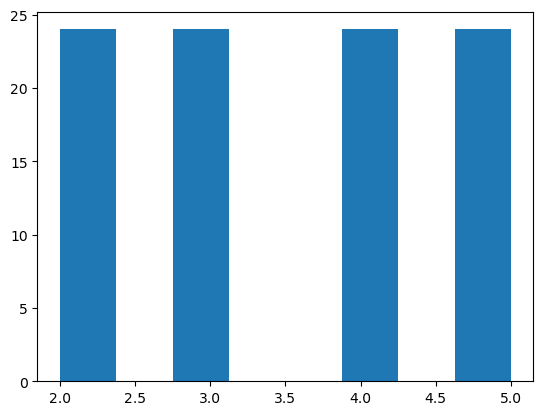

In [23]:
plt.hist(label_contact_case, bins=8)

In [24]:
samples={}

gen = zip(label_contact_case, event_arrays) 
for i, (case, event_array) in enumerate(gen):
    samples[f'sample_{i+1}'] = {
        'events': event_array.tolist(),
        'case': case
        }


In [25]:
from pathlib import Path
import json

EXTRACTIONS_DIR = Path('./data/small/').resolve()
outdir = EXTRACTIONS_DIR / 'contact_extraction5'

if not outdir.exists():
    outdir.mkdir(parents=True)
    

with open(outdir / 'samples.json', 'w') as f:
    json.dump(samples, f, indent=4)

In [26]:
from sklearn.model_selection import train_test_split


sample_idx = list(samples.keys())
cases = [str(samples[s_idx]['case']) for s_idx in sample_idx]

train_idx, val_test_idx = train_test_split(sample_idx, test_size=1-0.7, random_state=0) #fixed across extractions

cases = [str(samples[s_idx]['case']) for s_idx in val_test_idx]
val_idx, test_idx = train_test_split(val_test_idx, test_size=0.5, random_state=0) #fixed across extractions

print(len(train_idx), len(val_idx), len(test_idx))
subsets = zip(['train', 'test', 'val'], [train_idx, val_idx, test_idx])

if not outdir.exists():
    outdir.mkdir(parents=True)

for sub_name, subset in subsets:
    if not (outdir / sub_name).exists():
        (outdir / sub_name / 'raw').mkdir(parents=True)
        (outdir / sub_name / 'processed').mkdir(parents=True)
    with open(outdir / sub_name / 'raw' / 'contact_cases.json', 'w') as f:
        subset_samples = {}
        for i, subset_idx in enumerate(subset):
            sample = samples[subset_idx]
            sample['total_idx'] = subset_idx
            subset_samples[f'sample_{i+1}'] = sample
        json.dump(subset_samples, f, indent=4)

67 14 15


In [27]:
from __future__ import division
import os.path as osp
import glob
import torch
import torch_geometric.transforms as T
import os
import json 
#os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
#os.environ["CUDA_VISIBLE_DEVICES"]="0"

import torch.utils.data
from torch_geometric.data import Data, DataLoader, Dataset

import numpy as np

import torch
import torch_geometric.transforms as T
from torch_geometric.data import DataLoader
from collections.abc import Sequence

import os.path as osp
from pathlib import Path

import torch
from torch_geometric.data import Dataset
from torch_geometric.data import Data
from torch_geometric.nn.pool import radius_graph, knn_graph
from torch_geometric.utils import remove_isolated_nodes

In [28]:
from src.imports.TrainModel import TrainModel

5
[[0, 0, 0], [0.05235987755982989, -1.2824471291478601e-17, 0], [0.10471975511965978, -2.5648942582957202e-17, 0], [0.15707963267948966, -3.8473413874435795e-17, 0], [0.20943951023931956, -5.1297885165914404e-17, 0]]


In [34]:
import torch

from torch_geometric.data import Data
from torch_geometric.nn.pool import max_pool_x, voxel_grid
from typing import List, Optional, Tuple, Union


class MaxPoolingX(torch.nn.Module):

    def __init__(self, voxel_size: List[int], size: int):
        super(MaxPoolingX, self).__init__()
        self.voxel_size = voxel_size
        self.size = size

    def forward(self, x: torch.Tensor, pos: torch.Tensor, batch: Optional[torch.Tensor] = None
                ) -> Union[Tuple[torch.Tensor, torch.Tensor, torch.LongTensor, torch.Tensor, torch.Tensor], Data]:
        cluster = voxel_grid(pos, batch=batch, size=self.voxel_size)
        x, _ = max_pool_x(cluster, x, batch, size=self.size)
        return x

    def __repr__(self):
        return f"{self.__class__.__name__}(voxel_size={self.voxel_size}, size={self.size})"

import torch

from torch_geometric.data import Data
from torch_geometric.nn.pool import max_pool, voxel_grid
from typing import Callable, List, Optional, Tuple, Union


class MaxPooling(torch.nn.Module):

    def __init__(self, size: List[int], transform: Callable[[Data, ], Data] = None):
        super(MaxPooling, self).__init__()
        self.voxel_size = list(size)
        self.transform = transform

    def forward(self, x: torch.Tensor, pos: torch.Tensor, batch: Optional[torch.Tensor] = None,
                edge_index: Optional[torch.Tensor] = None, return_data_obj: bool = False
                ) -> Union[Tuple[torch.Tensor, torch.Tensor, torch.LongTensor, torch.Tensor, torch.Tensor], Data]:
        assert edge_index is not None, "edge_index must not be None"

        cluster = voxel_grid(pos[:, :2], batch=batch, size=self.voxel_size)
        data = Data(x=x, pos=pos, edge_index=edge_index, batch=batch)
        data = max_pool(cluster, data=data, transform=self.transform)  # transform for new edge attributes
        if return_data_obj:
            return data
        else:
            return data.x, data.pos, getattr(data, "batch"), data.edge_index, data.edge_attr

    def __repr__(self):
        return f"{self.__class__.__name__}(voxel_size={self.voxel_size})"

import torch
import torch_geometric

from torch.nn import Linear
from torch.nn.functional import elu
from torch_geometric.nn.conv import SplineConv
from torch_geometric.nn.norm import BatchNorm
from torch_geometric.transforms import Cartesian


class GraphRes_lightheavy(torch.nn.Module):

    def __init__(self):
        super(GraphRes_lightheavy, self).__init__()
        dim = 3

        bias = False
        root_weight = False
        pooling_size=(16/346, 12/260)

        # Set dataset specific hyper-parameters.
        #kernel_size = 2
        #n = [1, 8, 16, 16, 16, 32, 32, 32, 32]
        #pooling_outputs = 32
        kernel_size = 8
        n = [1, 16, 32, 32, 32, 128, 128, 128]
        pooling_outputs = 128

        self.conv1 = SplineConv(n[0], n[1], dim=dim, kernel_size=kernel_size, bias=bias, root_weight=root_weight)
        self.norm1 = BatchNorm(in_channels=n[1])
        self.conv2 = SplineConv(n[1], n[2], dim=dim, kernel_size=kernel_size, bias=bias, root_weight=root_weight)
        self.norm2 = BatchNorm(in_channels=n[2])

        self.conv3 = SplineConv(n[2], n[3], dim=dim, kernel_size=kernel_size, bias=bias, root_weight=root_weight)
        self.norm3 = BatchNorm(in_channels=n[3])
        self.conv4 = SplineConv(n[3], n[4], dim=dim, kernel_size=kernel_size, bias=bias, root_weight=root_weight)
        self.norm4 = BatchNorm(in_channels=n[4])

        self.conv5 = SplineConv(n[4], n[5], dim=dim, kernel_size=kernel_size, bias=bias, root_weight=root_weight)
        self.norm5 = BatchNorm(in_channels=n[5])
        self.pool5 = MaxPooling(pooling_size, transform=Cartesian(norm=True, cat=False))

        self.conv6 = SplineConv(n[5], n[6], dim=dim, kernel_size=kernel_size, bias=bias, root_weight=root_weight)
        self.norm6 = BatchNorm(in_channels=n[6])
        self.conv7 = SplineConv(n[6], n[7], dim=dim, kernel_size=kernel_size, bias=bias, root_weight=root_weight)
        self.norm7 = BatchNorm(in_channels=n[7])

        self.pool7 = MaxPoolingX(0.25, size=16)
        self.fc = Linear(pooling_outputs * 16, out_features=2, bias=bias)

    def forward(self, data: torch_geometric.data.Batch) -> torch.Tensor:
        data.x = elu(self.conv1(data.x, data.edge_index, data.edge_attr))
        data.x = self.norm1(data.x)
        data.x = elu(self.conv2(data.x, data.edge_index, data.edge_attr))
        data.x = self.norm2(data.x)

        x_sc = data.x.clone()
        data.x = elu(self.conv3(data.x, data.edge_index, data.edge_attr))
        data.x = self.norm3(data.x)
        data.x = elu(self.conv4(data.x, data.edge_index, data.edge_attr))
        data.x = self.norm4(data.x)
        data.x = data.x + x_sc

        data.x = elu(self.conv5(data.x, data.edge_index, data.edge_attr))
        data.x = self.norm5(data.x)
        data = self.pool5(data.x, pos=data.pos, batch=data.batch, edge_index=data.edge_index, return_data_obj=True)

        x_sc = data.x.clone()
        data.x = elu(self.conv6(data.x, data.edge_index, data.edge_attr))
        data.x = self.norm6(data.x)
        data.x = elu(self.conv7(data.x, data.edge_index, data.edge_attr))
        data.x = self.norm7(data.x)
        data.x = data.x + x_sc

        x = self.pool7(data.x, pos=data.pos[:, :2], batch=data.batch)
        x = x.view(-1, self.fc.in_features)
        return self.fc(x)


In [35]:
model = GraphRes_lightheavy()
model

GraphRes_lightheavy(
  (conv1): SplineConv(1, 16, dim=3)
  (norm1): BatchNorm(16)
  (conv2): SplineConv(16, 32, dim=3)
  (norm2): BatchNorm(32)
  (conv3): SplineConv(32, 32, dim=3)
  (norm3): BatchNorm(32)
  (conv4): SplineConv(32, 32, dim=3)
  (norm4): BatchNorm(32)
  (conv5): SplineConv(32, 128, dim=3)
  (norm5): BatchNorm(128)
  (pool5): MaxPooling(voxel_size=[0.046242774566473986, 0.046153846153846156])
  (conv6): SplineConv(128, 128, dim=3)
  (norm6): BatchNorm(128)
  (conv7): SplineConv(128, 128, dim=3)
  (norm7): BatchNorm(128)
  (pool7): MaxPoolingX(voxel_size=0.25, size=16)
  (fc): Linear(in_features=2048, out_features=2, bias=False)
)

In [31]:
with open('data/small/contact_extraction5/extraction_params.json', 'w') as f:
    params = json.dump({}, f)

In [36]:
#!rm -rf data/small/contact_extraction5/{test,train,val}/processed/*.pt
tm = TrainModel('data/small/contact_extraction5/', model.cuda(), batch=4, lr=0.01, n_epochs=300, features='pol' , )

In [37]:
tm.train()

training:   0%|          | 0/300 [00:00<?, ?epoch/s]

  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


  0%|          | 0/17 [00:00<?, ?batch/s]

logging


In [32]:
tm.test()

0.027840639568037458

In [33]:
np.degrees(0.022052728881438572)

1.263528291652687

In [34]:
loss = 0
losses = []
for i, data in enumerate(tm.val_loader):      
    data = data.to(tm.device)
    end_point = tm.model(data)
    l = tm.loss_func(end_point, data.y).detach().item()
    loss += l
    losses.append(l)

In [35]:
np.degrees(losses)

array([1.03670874, 0.84914272, 0.52767272, 0.48753207, 1.30883596,
       4.94151807, 2.06840582, 1.73942496, 0.94586039, 0.78980519])

In [36]:
def test(self):
    loss = 0
    for i, data in enumerate(self.test_loader):      
        data = data.to(self.device)
        end_point = self.model(data)

        loss += self.loss_func(end_point, data.y).detach().item()
    loss /= len(self.test_data)
    return loss

test(tm)

0.027874248930149607

In [37]:
np.degrees(0.01119551466157039
          )

0.6414557395848176

In [38]:
def test(self):
    loss = 0
    for i, data in enumerate(self.train_loader):      
        data = data.to(self.device)
        end_point = self.model(data)
        print(end_point)
        loss += self.loss_func(end_point, data.y).detach().item()
    loss /= len(self.train_loader)
    return loss

test(tm)

tensor([[0.1663, 0.0314],
        [0.0852, 0.0056],
        [0.0000, 0.0000],
        [0.0000, 0.0000]], device='cuda:0', grad_fn=<MmBackward0>)
tensor([[ 0.0907, -0.0166],
        [ 0.0404, -0.0060],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000]], device='cuda:0', grad_fn=<MmBackward0>)
tensor([[ 0.1191, -0.0234],
        [ 0.1402,  0.0033],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000]], device='cuda:0', grad_fn=<MmBackward0>)
tensor([[ 0.0619,  0.0565],
        [ 0.0960, -0.0024],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000]], device='cuda:0', grad_fn=<MmBackward0>)
tensor([[ 0.1010,  0.0005],
        [ 0.0982, -0.0030],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000]], device='cuda:0', grad_fn=<MmBackward0>)
tensor([[ 0.0177,  0.0066],
        [ 0.0596, -0.0123],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000]], device='cuda:0', grad_fn=<MmBackward0>)
tensor([[ 0.1761,  0.0354],
        [ 0.0783, -0.0073],
        [ 0.0000,  0.0000],
      

0.041846861046823586

In [39]:
len(tm.train_loader)

11